# Feature importance for the clonal embedding

In this notebook, we will identify which gene expression correlates exists in the data.

In [9]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scvelo as scv
import sys
import decoupler as dc

sys.path.append("/home/sergey/tools/scLiTr/")
import sclitr as sl

sc.set_figure_params(dpi=100, dpi_save=300)
scv.settings.verbosity = 0
sns.set_style("ticks")

import matplotlib
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

from catboost import Pool, CatBoostRegressor
from geosketch import gs

Here we will work with clonal embedding that we got in one of the previous tutorials.

In [3]:
adata = sl.datasets.Weinreb_in_vitro()
clones = sc.read_h5ad("Weinreb_clones.h5ad")

## Neu → Mo → DC axis (targeted research)

Let's start with the clones that are continuously linked by emount of neutrophils, monocytes, and dendritic cells.

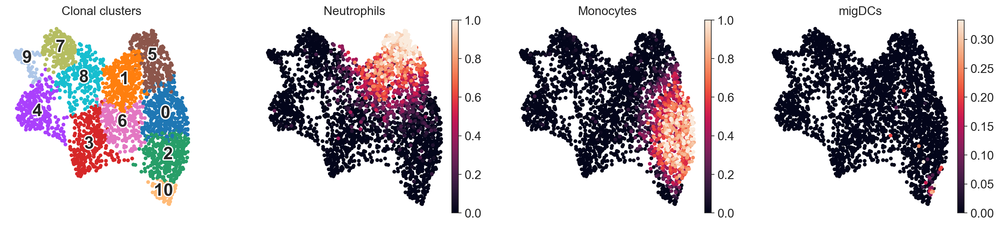

In [903]:
sc.pl.umap(
    clones,
    color=["leiden", "Neu", "Mo", "migDC"],
    layer="frequencies",
    frameon=False,
    s=75,
    legend_loc="on data",
    legend_fontoutline=3,
    legend_fontsize=20,
    title=["Clonal clusters", "Neutrophils", "Monocytes", "migDCs"],
    save="_clonal_clusters.pdf",
)

Now we're subselecting clusters 5, 0, 2, and 10 so we can identify *clonal trajectory* (axis of variation within clone2vec space).

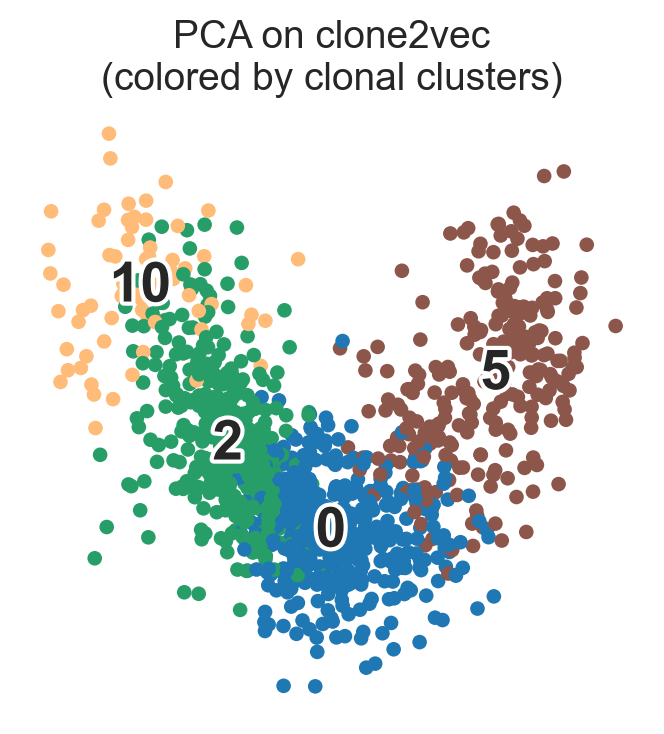

In [904]:
clones = clones[clones.obs.leiden.isin(["0", "2", "5", "10"])].copy()

clones.obsm["X_pca"] = sc.pp.pca(clones.obsm["clone2vec"])
sc.pl.pca(
    clones,
    title="PCA on clone2vec\n(colored by clonal clusters)",
    frameon=False,
    color="leiden",
    legend_loc="on data",
    legend_fontoutline=3,
    legend_fontsize=20,
    save="_Mo_Neu.pdf",
)

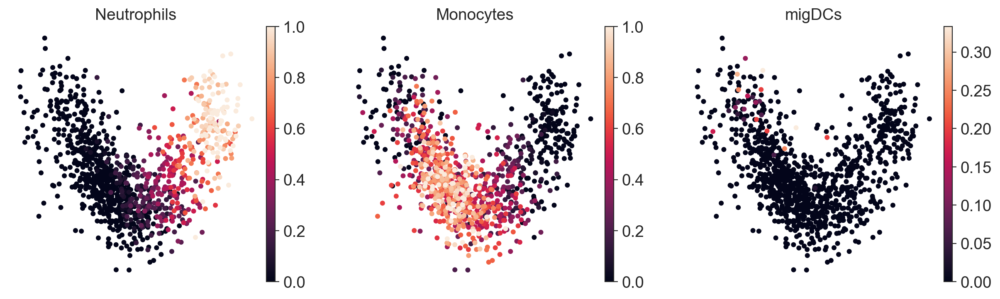

In [905]:
sc.pl.pca(
    clones,
    color=["Neu", "Mo", "migDC"],
    layer="frequencies",
    frameon=False,
    s=75,
    legend_loc="on data",
    legend_fontoutline=3,
    legend_fontsize=20,
    title=["Neutrophils", "Monocytes", "migDCs"],
    save="_Mo_Neu_proportions.pdf",
)

Here we're using diffusion pseudotime, but even first PC coordinate will be enough in many cases.

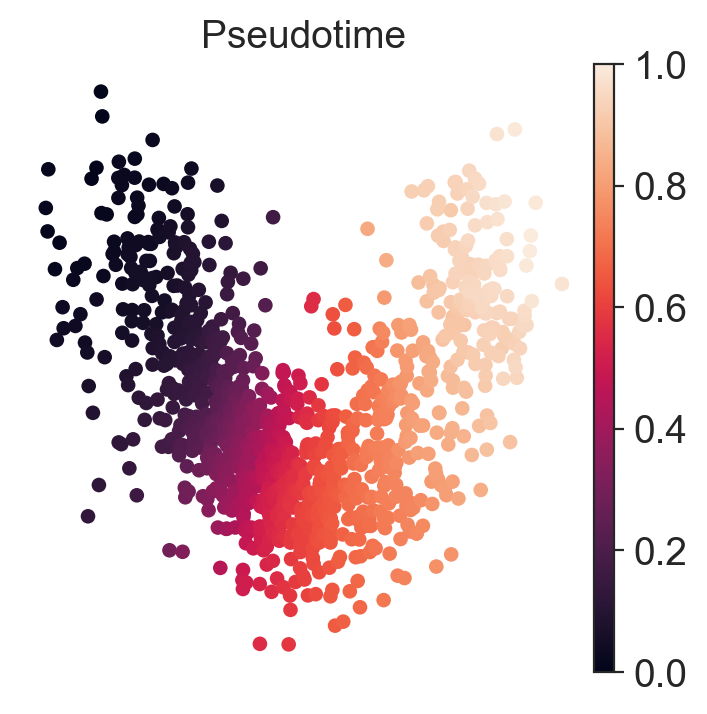

In [906]:
clones.uns["iroot"] = np.argmax(clones.obsm["X_pca"][:, 1])
sc.pp.neighbors(clones, use_rep="X_pca", n_pcs=2)
sc.tl.diffmap(clones, n_comps=3)
sc.tl.dpt(clones, n_dcs=3)

sc.pl.pca(clones, color="dpt_pseudotime", title="Pseudotime", frameon=False,
          save="_pseudotime.pdf",)

Let's visualize changes in cell type composition across this clonal trajectory.

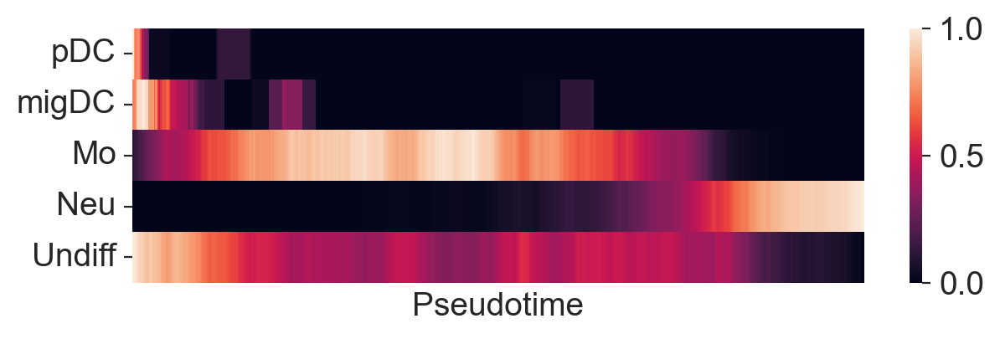

In [907]:
# Smoothing and var-normalization
window_size = 50

clones_sorted = clones[
    clones.obs.dpt_pseudotime.sort_values().index,
    ["pDC", "migDC", "Mo", "Neu", "Undiff"],
].copy()
clones_sorted.X = np.array([
    clones_sorted.layers["frequencies"][i:i+window_size].mean(axis=0)
    for i in range(len(clones_sorted))
])
clones_sorted.X = clones_sorted.X / clones_sorted.X.max(axis=0)

fig, ax = plt.subplots(figsize=(7, 2))
sns.heatmap(clones_sorted.to_df().T, ax=ax)
ax.set_xticks([], [])
ax.set_xlabel("Pseudotime")

plt.savefig("figures/proportions_pseudotime.pdf", bbox_inches="tight")

### Identification of important genes

To identify gene expression correlates of clonal behaviours, we're going to create a model that maps gene expression onto a pseudotime axis. To capture meta-cell type correlates, we're averaging expression of each cell type in each clone, and using this as an imput to the model. This helps us to avoid learning only cell type properties.

In [826]:
import decoupler as dc

# Decreasing gene number
sc.pp.filter_genes(adata, min_cells=25)

# Pseudobulking
adata = adata[adata.obs.Clone.isin(clones.obs_names)].copy()
pdata = dc.get_pseudobulk(
    adata,
    sample_col="Clone",
    groups_col="Cell type annotation short",
    mode="mean",
    min_cells=0,
    min_counts=0,
)

# Keeping only cell types of interest
pdata = pdata[pdata.obs["Cell type annotation short"].isin(
    ["Undiff", "pDC", "migDC", "Mo", "Neu"]
)].copy()
pdata.obs["dpt_pseudotime"] = clones[pdata.obs.Clone].obs["dpt_pseudotime"].values

To avoid overfitting of the model (number of genes in our training data is much more than the number of observations), we're fairly splitting our clones into train and validation sets with [geosketching](https://github.com/brianhie/geosketch) approach.

In [831]:
from geosketch import gs

clone_names = clones.obs_names
sketch_index = gs(clones.obsm["clone2vec"], len(clones) // 5, replace=False)
validation_clone_names = clone_names[sketch_index]

pdata_train = pdata[~pdata.obs.Clone.isin(validation_clone_names)].copy()
pdata_validation = pdata[pdata.obs.Clone.isin(validation_clone_names)].copy()

Let's check that the distribution across pseudotime is similar.

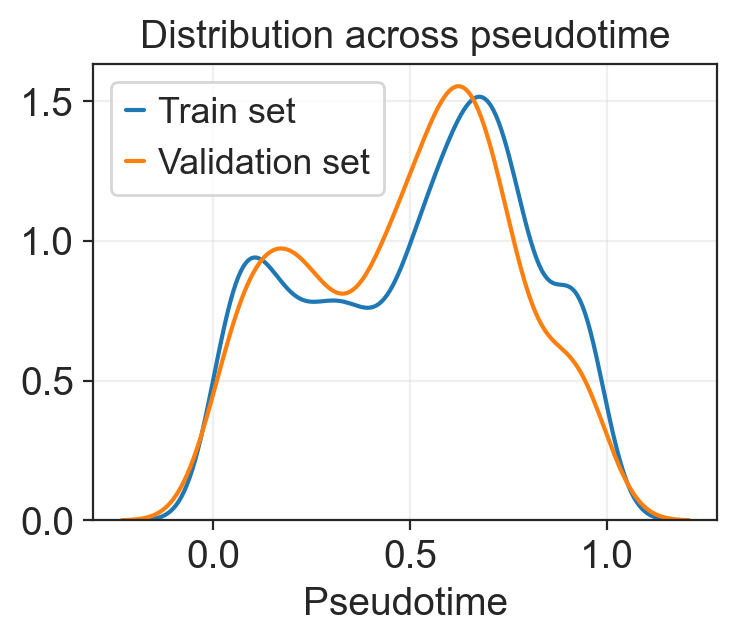

In [909]:
fig, ax = plt.subplots(figsize=(4, 3))

sns.kdeplot(pdata_train.obs.dpt_pseudotime, label="Train set")
sns.kdeplot(pdata_validation.obs.dpt_pseudotime, label="Validation set")

ax.legend()
ax.set_ylabel("")
ax.set_xlabel("Pseudotime")
ax.set_title("Distribution across pseudotime")
ax.grid(alpha=0.3)

plt.savefig("figures/pseudotime_train_validation.pdf", bbox_inches="tight")

We will feed cell type label of pseudobulk explicitly to our model as a categorical variable. For modelling, we decided to use [CatBoost](https://catboost.ai) because of a number of reasons:
1. CatBoost is quite robust to the overfitting,
2. CatBoost natively uses categorical variables.

In [873]:
X_train = pd.concat([pdata_train.to_df(), pdata_train.obs["Cell type annotation short"]], axis=1)
y_train = pdata_train.obs[["dpt_pseudotime"]]

X_validation = pd.concat([pdata_validation.to_df(), pdata_validation.obs["Cell type annotation short"]], axis=1)
y_validation = pdata_validation.obs[["dpt_pseudotime"]]

In the next step we're preparing train and validation datasets.

In [874]:
from catboost import Pool

train = Pool(
    data=X_train,
    label=y_train,
    cat_features=["Cell type annotation short"],
)

validation = Pool(
    data=X_validation,
    label=y_validation,
    cat_features=["Cell type annotation short"],
)

And finally we can launch CatBoostRegressor model that will try to predict pseudotime based on expression of cell types within each clone.

**This step is very computationally heavy and might takes a while.**

In [ ]:
from catboost import CatBoostRegressor

model = CatBoostRegressor(
    loss_function="RMSE",
    eval_metric="RMSE",
    num_trees=10000,
    early_stopping_rounds=100,
)
model.fit(train, eval_set=validation, use_best_model=True)

To save the model, just use
```python
model.save_model("catboost_models/Neu_Mo_axis.cbm")
```

And to read the model, use this:
```python
model = CatBoostRegressor()
model.load_model("catboost_models/Neu_Mo_axis.cbm")
```

And now we can check how accurate our predictions are on a validation set (was used to avoid overfitting).

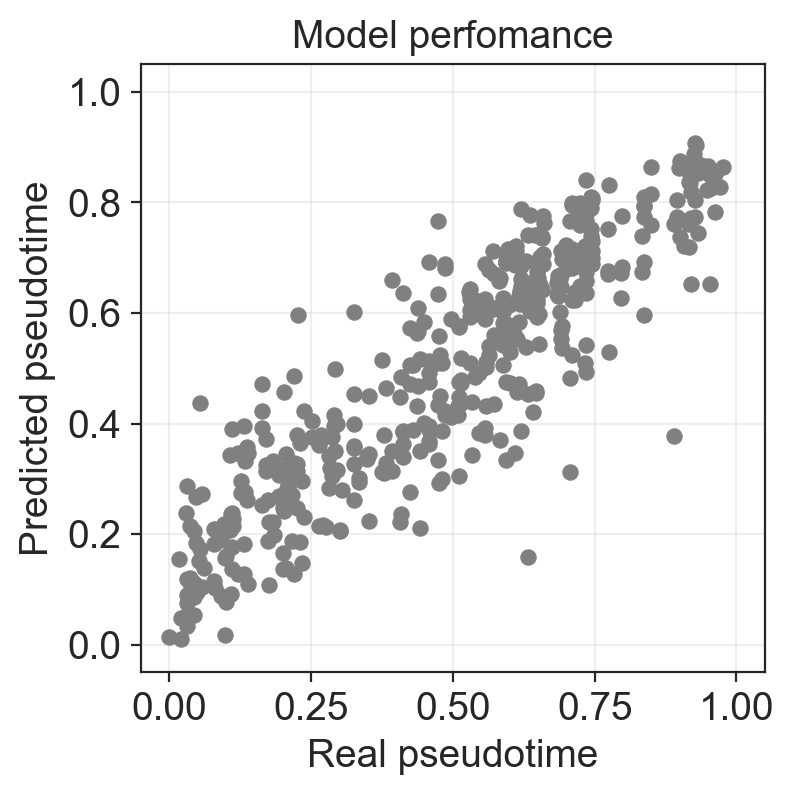

In [908]:
y_prediction = model.predict(X_validation)

fig, ax = plt.subplots(figsize=(4, 4))

sns.scatterplot(
    x=y_validation.dpt_pseudotime,
    y=y_prediction,
    edgecolor=None,
    s=30,
    color="grey",
)

ax.grid(alpha=0.3)
ax.set_xlabel("Real pseudotime")
ax.set_ylabel("Predicted pseudotime")

ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)

ax.set_title("Model perfomance")
plt.savefig("figures/pseudotime_predictions.pdf", bbox_inches="tight")

We see that our model is performing quite well. Now let's inspect the importance of each feature using [Shapley Values](https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/tree_based_models/Catboost%20tutorial.html). Shortly, Shapley Value helps to identify signed importance of each feature for each prediction of the model. Positive values mean that the model underestimates target value without this feature, and negative values means the opposite.

In [876]:
shap_values = model.get_feature_importance(
    data=Pool(
        data=pd.concat([pdata.to_df(), pdata.obs["Cell type annotation short"]], axis=1),
        label=pdata.obs.dpt_pseudotime.values,
        cat_features=["Cell type annotation short"],
    ),
    type="ShapValues",
)[:, :-1]

To simplify our work, let's create AnnData object with Shapley Values.

In [913]:
shapdata = sc.AnnData(
    shap_values,
    obs=pdata.obs,
    var=pd.DataFrame(index=list(pdata.var_names) + ["Cell type"]),
)
shapdata.var["mean_SHAP_magnitude"] = np.abs(shapdata.X).mean(axis=0)

shapdata.var["mean_SHAP_magnitude"].sort_values(ascending=False).head(5)

S100a8    0.040353
Gstm1     0.031390
H2-Aa     0.017020
Cd74      0.016318
Hk3       0.015869
Name: mean_SHAP_magnitude, dtype: float64

Here we see importance of each gene for the prediction, but we don't know if the changes in predicted pseudotime are positively or negatively correlated with the gene expression. Let's figure it out. But firstly, let's check importance of cell type itself:

In [978]:
def plot_SHAP(
    shapdata,
    genes,
    groupby,
    title=None,
    colorby=None,
    plot0=True,
    abs_values=False,
    fig_height=3,
    **kwargs,
):
    fig, axes = plt.subplots(
        ncols=len(genes),
        figsize=(4 * len(genes), fig_height),
    )
    
    for i in range(len(genes)):
        if len(genes) == 1:
            ax = axes
        else:
            ax = axes[i]
        gene = genes[i]

        gene_shap = shapdata[:, gene].X.T[0]
        celltypes = shapdata.obs[groupby].values
        
        if title is None:
            title_current = gene
        else:
            title_current = title
            
        if colorby is None:
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                zorder=1,
                **kwargs,
            )
        elif colorby == "gene_expression":
            gene_expression = pdata[:, gene].X.T[0]
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                hue=gene_expression,
                zorder=1,
                **kwargs,
            )
            ax.legend().remove()
        else:
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                hue=shapdata.obs[colorby],
                zorder=1,
                **kwargs,
            )
            ax.legend().remove()

        ax.grid(alpha=0.3)
        ax.set_xlabel("SHAP value")
        ax.set_title(title_current)

        ax.set_ylim(ax.get_ylim())
        if not abs_values:
            ax.plot([0, 0], [-100, 100], color="black", linestyle="--",
                    linewidth=1, zorder=-100)
        else:
            ax.set_xlim(0, None)

    plt.tight_layout()

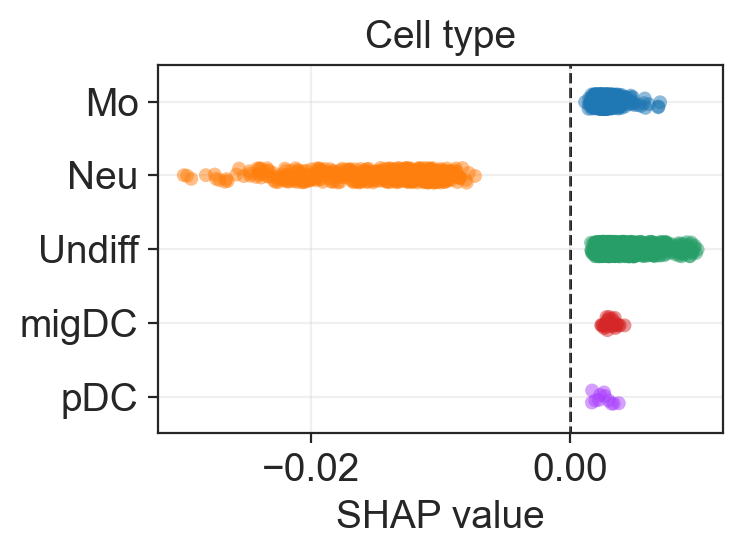

In [936]:
plot_SHAP(
    shapdata=shapdata,
    genes=["Cell type"],
    groupby="Cell type annotation short",
    colorby="Cell type annotation short",
)

plt.savefig("figures/pseudotime_SHAP_ct.pdf", bbox_inches="tight")

We see that cell type label is quite important for the positioning of the cells on a pseudotime axis. But what's about the gene expressions?

In [915]:
from scipy.stats import pearsonr

shapdata.var["expr_correlation"] = [
    pearsonr(
        shapdata[:, gene].X.T[0],
        pdata[:, gene].X.T[0],
    ).statistic if gene != "Cell type" else 
    0 for gene in shapdata.var_names
]
shapdata.var["expr_correlation"] = shapdata.var["expr_correlation"].fillna(0)

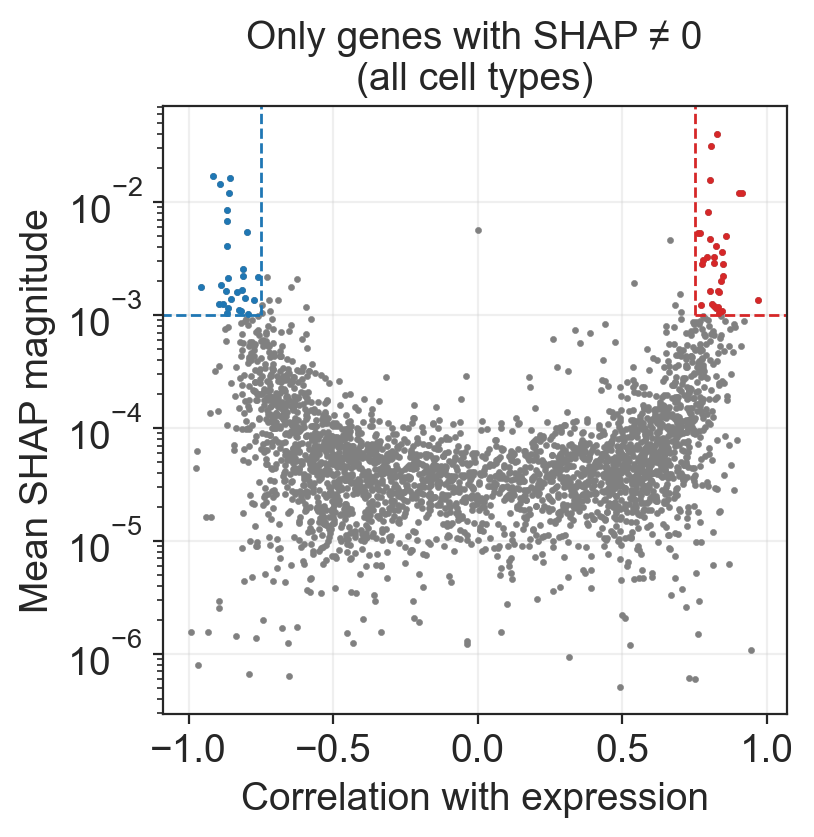

In [916]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=shapdata.var,
    ax=ax,
    s=5,
    edgecolor=None,
    color="grey",
)

ax.set(yscale="log")
ax.set_xlim(*ax.get_xlim())
ax.set_ylim(*ax.get_ylim())

min_magnitude = 1e-3
min_correlation = 0.75

genes_down = shapdata.var[
    (shapdata.var.expr_correlation <= -min_correlation) &
    (shapdata.var.mean_SHAP_magnitude >= min_magnitude)
]
ax.plot([-100, -min_correlation], [min_magnitude, min_magnitude],
        linestyle="--", linewidth=1, color=sns.color_palette()[0])
ax.plot([-min_correlation, -min_correlation], [min_magnitude, 100],
        linestyle="--", linewidth=1, color=sns.color_palette()[0])
sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=genes_down,
    ax=ax,
    s=5,
    edgecolor=None,
    color=sns.color_palette()[0],
)

genes_up = shapdata.var[
    (shapdata.var.expr_correlation >= min_correlation) &
    (shapdata.var.mean_SHAP_magnitude >= min_magnitude)
]
ax.plot([min_correlation, 100], [min_magnitude, min_magnitude],
        linestyle="--", linewidth=1, color=sns.color_palette()[3])
ax.plot([min_correlation, min_correlation], [min_magnitude, 100],
        linestyle="--", linewidth=1, color=sns.color_palette()[3])
sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=genes_up,
    ax=ax,
    s=5,
    edgecolor=None,
    color=sns.color_palette()[3],
)

ax.grid(alpha=0.3)
ax.set_xlabel("Correlation with expression")
ax.set_ylabel("Mean SHAP magnitude")
ax.set_title("Only genes with SHAP ≠ 0\n(all cell types)")

plt.savefig("figures/pseudotime_correlates.pdf", bbox_inches="tight")

Let's analyse positively and negatively correlated genes separately:

In [83]:
# Towards neutrophils
genes_down.sort_values("mean_SHAP_magnitude", ascending=False).head(5)

,mean_SHAP_magnitude,expr_correlation
Cd74,0.015511,-0.855645
H2-Aa,0.015382,-0.946444
H2-Eb1,0.014917,-0.897575
Ly6a,0.011683,-0.845194
Ighm,0.009479,-0.858229


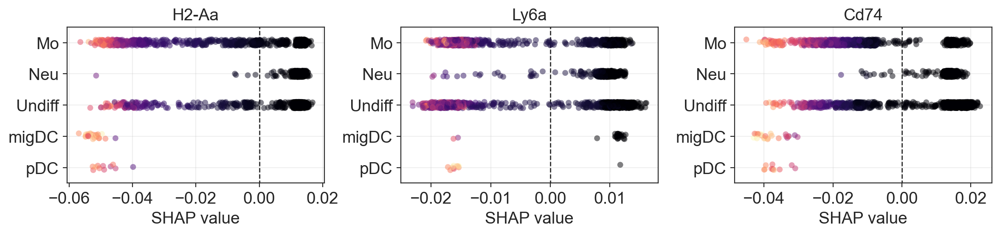

In [937]:
plot_SHAP(
    shapdata=shapdata,
    genes=["H2-Aa", "Ly6a", "Cd74"],
    groupby="Cell type annotation short",
    colorby="gene_expression",
    palette="magma",
)

plt.savefig("figures/pseudotime_SHAP_all_Neu.pdf", bbox_inches="tight")

In [85]:
# Towards Monocytes + DC
genes_up.sort_values("mean_SHAP_magnitude", ascending=False).head(5)

,mean_SHAP_magnitude,expr_correlation
S100a8,0.038917,0.803704
Gstm1,0.032393,0.796543
Hk3,0.019625,0.811529
Cd63,0.012297,0.912410
Wfdc21,0.008467,0.910144


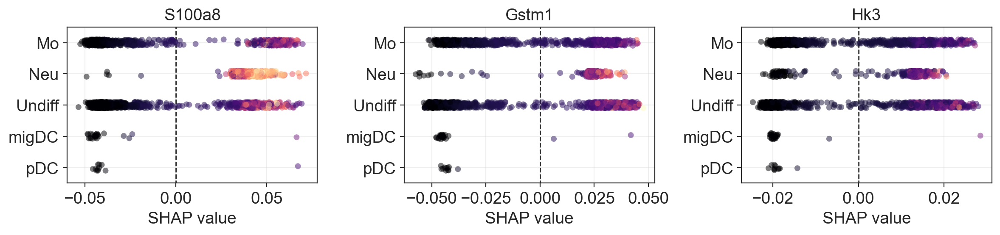

In [938]:
plot_SHAP(
    shapdata=shapdata,
    genes=["S100a8", "Gstm1", "Hk3"],
    groupby="Cell type annotation short",
    colorby="gene_expression",
    palette="magma",
)

plt.savefig("figures/pseudotime_SHAP_all_Mono.pdf", bbox_inches="tight")

### Focus on undifferentiated cells

We see that some gene expression features are common for all of the cell types. But also, mechanics of Shapley Values helps us to focus only on some specific cell type.

In [919]:
shapdata_undiff = shapdata[shapdata.obs["Cell type annotation short"] == "Undiff"].copy()

shapdata_undiff.var["mean_SHAP_magnitude"] = shapdata_undiff.X.mean(axis=0)
shapdata_undiff.var["expr_correlation"] = [
    pearsonr(
        shapdata_undiff[:, gene].X.T[0],
        pdata[shapdata_undiff.obs_names][:, gene].X.T[0],
    ).statistic if gene != "Cell type" else 0
    for gene in shapdata_undiff.var_names
]
shapdata_undiff.var["expr_correlation"] = shapdata_undiff.var["expr_correlation"].fillna(0)

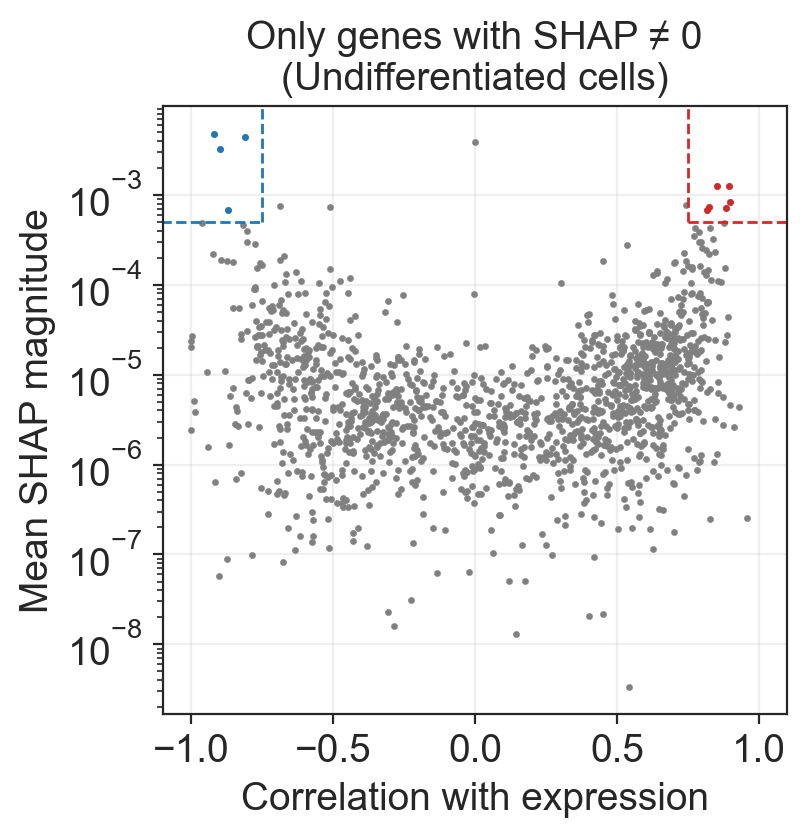

In [920]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=shapdata_undiff.var,
    ax=ax,
    s=5,
    edgecolor=None,
    color="grey",
)

ax.set(yscale="log")
ax.set_xlim(*ax.get_xlim())
ax.set_ylim(*ax.get_ylim())

min_magnitude = 5e-4
min_correlation = 0.75

genes_down_undiff = shapdata_undiff.var[
    (shapdata_undiff.var.expr_correlation <= -min_correlation) &
    (shapdata_undiff.var.mean_SHAP_magnitude >= min_magnitude)
]
ax.plot([-100, -min_correlation], [min_magnitude, min_magnitude],
        linestyle="--", linewidth=1, color=sns.color_palette()[0])
ax.plot([-min_correlation, -min_correlation], [min_magnitude, 100],
        linestyle="--", linewidth=1, color=sns.color_palette()[0])
sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=genes_down_undiff,
    ax=ax,
    s=5,
    edgecolor=None,
    color=sns.color_palette()[0],
)

genes_up_undiff = shapdata_undiff.var[
    (shapdata_undiff.var.expr_correlation >= min_correlation) &
    (shapdata_undiff.var.mean_SHAP_magnitude >= min_magnitude)
]
ax.plot([min_correlation, 100], [min_magnitude, min_magnitude],
        linestyle="--", linewidth=1, color=sns.color_palette()[3])
ax.plot([min_correlation, min_correlation], [min_magnitude, 100],
        linestyle="--", linewidth=1, color=sns.color_palette()[3])
sns.scatterplot(
    x="expr_correlation",
    y="mean_SHAP_magnitude",
    data=genes_up_undiff,
    ax=ax,
    s=5,
    edgecolor=None,
    color=sns.color_palette()[3],
)

ax.grid(alpha=0.3)
ax.set_xlabel("Correlation with expression")
ax.set_ylabel("Mean SHAP magnitude")
ax.set_title("Only genes with SHAP ≠ 0\n(Undifferentiated cells)")

plt.savefig("figures/pseudotime_correlates_Undiff.pdf", bbox_inches="tight")

In [921]:
# Towards Neutrophils
genes_up_undiff.sort_values("mean_SHAP_magnitude", ascending=False).head(10)

,mean_SHAP_magnitude,expr_correlation
Rab38,0.001254,0.853247
Mpo,0.001240,0.893663
Elane,0.000833,0.898142
Gapdh,0.000733,0.823595
BC051077,0.000714,0.882724
Muc13,0.000686,0.817676


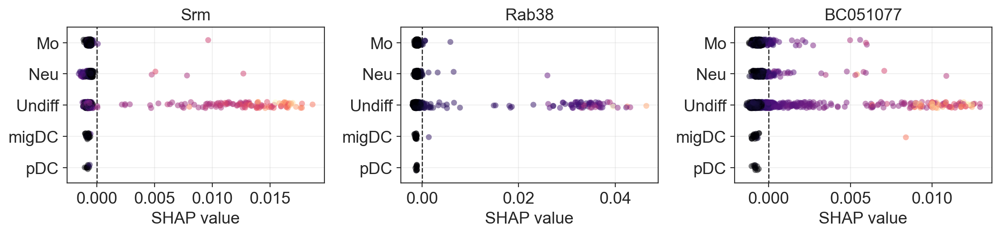

In [939]:
plot_SHAP(
    shapdata=shapdata,
    genes=["Srm", "Rab38", "BC051077"],
    groupby="Cell type annotation short",
    colorby="gene_expression",
    palette="magma",
)

plt.savefig("figures/pseudotime_SHAP_Neu_Undiff.pdf", bbox_inches="tight")

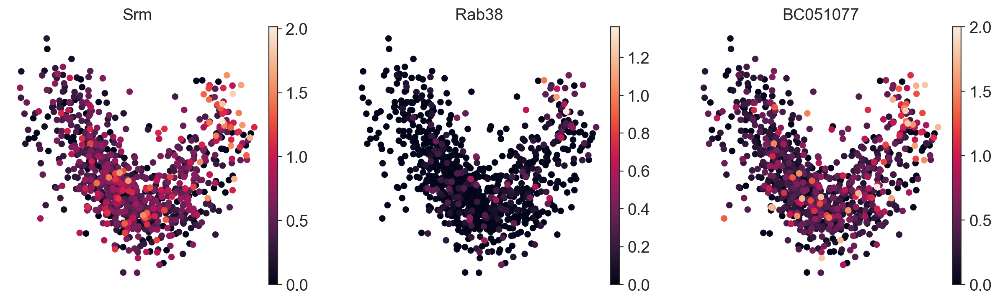

In [925]:
clones_expr = sl.tl.summarize_expression(
    adata,
    clones,
    obs_name="Clone",
    subset_obs="Cell type annotation short",
    target_value="Undiff",
)
clones_expr = clones_expr[clones[:, "Undiff"].X.T[0] > 0]

sc.pl.pca(clones_expr, color=["Srm", "Rab38", "BC051077"], frameon=False, save="_SHAP_Neu_Undiff.pdf")

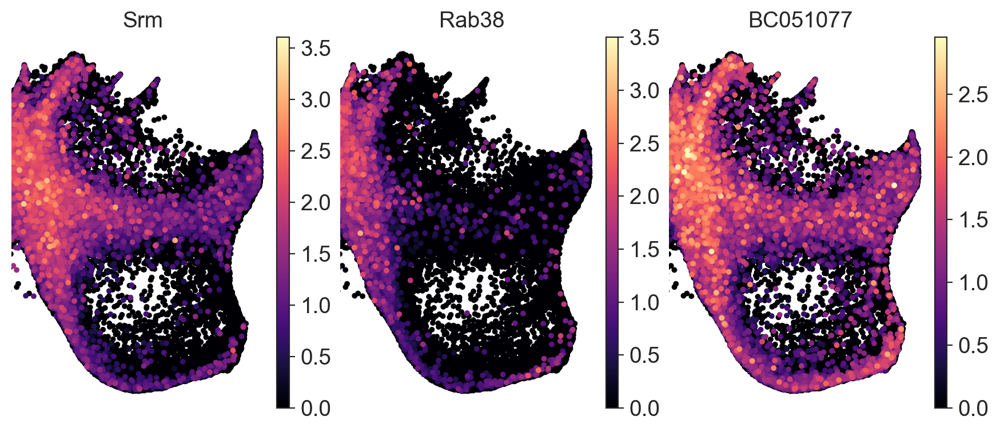

In [941]:
fig, axes = plt.subplots(figsize=(9, 4), ncols=3)

for i, gene in enumerate(["Srm", "Rab38", "BC051077"]):
    ax = axes[i]
    sc.pl.embedding(
        adata,
        basis="X_spring",
        color=gene,
        ax=ax,
        show=False,
        frameon=False,
        s=50,
        cmap="magma",
    )
    ax.set_xlim(0, 3200)
    
fig.tight_layout()

plt.savefig("figures/umap_SHAP_Neu_Undiff.pdf", bbox_inches="tight")

In [927]:
# Towards Monocytes + DC
genes_down_undiff.sort_values("mean_SHAP_magnitude", ascending=False).head(5)

,mean_SHAP_magnitude,expr_correlation
H2-Aa,0.004762,-0.919566
Cd74,0.004394,-0.807857
H2-Eb1,0.003222,-0.896330
Olfm1,0.000682,-0.867786


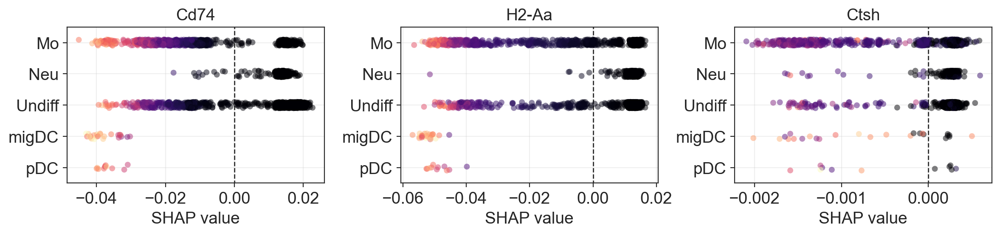

In [942]:
plot_SHAP(
    shapdata=shapdata,
    genes=["Cd74", "H2-Aa", "Ctsh"],
    groupby="Cell type annotation short",
    colorby="gene_expression",
    palette="magma",
)

plt.savefig("figures/pseudotime_SHAP_Mo_Undiff.pdf", bbox_inches="tight")

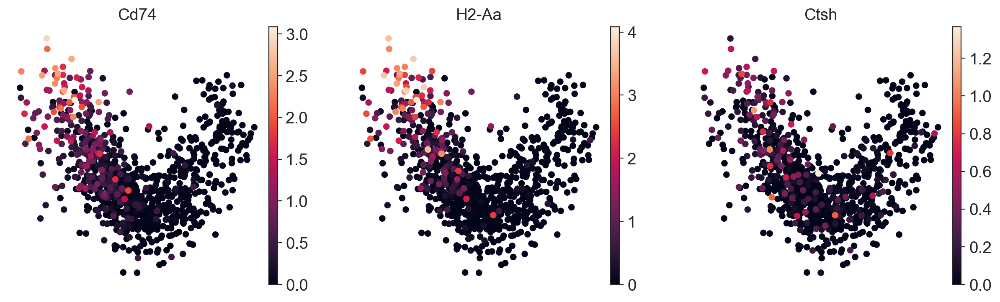

In [943]:
clones_expr = sl.tl.summarize_expression(
    adata,
    clones,
    obs_name="Clone",
    subset_obs="Cell type annotation short",
    target_value="Undiff",
)
clones_expr = clones_expr[clones[:, "Undiff"].X.T[0] > 0]

sc.pl.pca(clones_expr, color=["Cd74", "H2-Aa", "Ctsh"], frameon=False, save="_SHAP_Mo_Undiff.pdf")

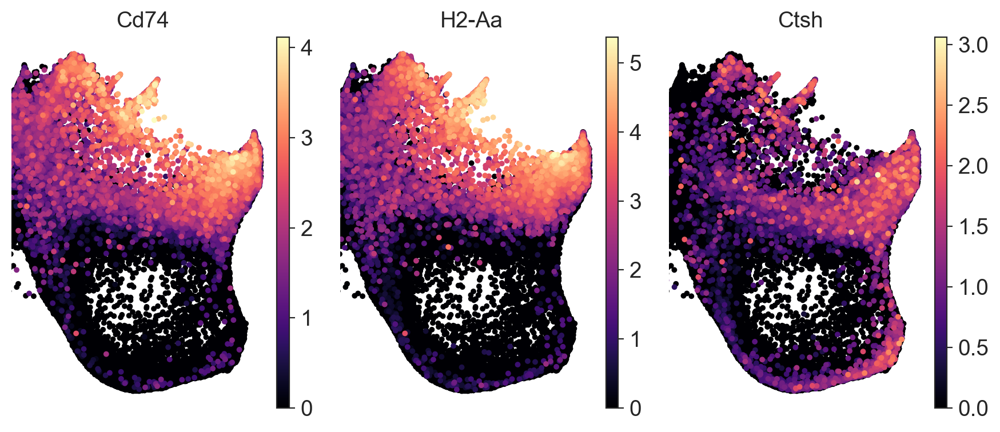

In [945]:
fig, axes = plt.subplots(figsize=(9, 4), ncols=3)

for i, gene in enumerate(["Cd74", "H2-Aa", "Ctsh"]):
    ax = axes[i]
    sc.pl.embedding(
        adata,
        basis="X_spring",
        color=gene,
        ax=ax,
        show=False,
        frameon=False,
        s=50,
        cmap="magma",
    )
    ax.set_xlim(0, 3200)
    
fig.tight_layout()
plt.savefig("figures/umap_SHAP_Mo_Undiff.pdf", bbox_inches="tight")

## Total identification of genes correlared with fate distribution

After target investigation of Neu → Mo → DC axis, we can try to identify all of the genes that are important to predict clonal behaviour. For this purpose, let's repeat algorithm above again, but aiming to predict clone2vec position instead of pseudotime value.

In [946]:
adata = sl.datasets.Weinreb_in_vitro()
clones = sc.read_h5ad("Weinreb_clones.h5ad")

clones_expr = sl.tl.summarize_expression(
    adata=adata,
    clones=clones,
    obs_name="Clone",
)

**Step 1**: pseudobulk generation.

In [947]:
# Decreasing gene number
sc.pp.filter_genes(adata, min_cells=25)

# Pseudobulking
adata = adata[adata.obs.Clone.isin(clones.obs_names)].copy()
pdata = dc.get_pseudobulk(
    adata,
    sample_col="Clone",
    groups_col="Cell type annotation short",
    mode="mean",
    min_cells=0,
    min_counts=0,
)

**Step 2**: train/validation split.

In [950]:
# Splitting into train and validation

clone_names = clones.obs_names
sketch_index = gs(clones.obsm["clone2vec"], len(clones) // 5, replace=False)
validation_clone_names = clone_names[sketch_index]

pdata_train = pdata[~pdata.obs.Clone.isin(validation_clone_names)].copy()
pdata_validation = pdata[pdata.obs.Clone.isin(validation_clone_names)].copy()

Now, let's check that we fairly splitted our data.

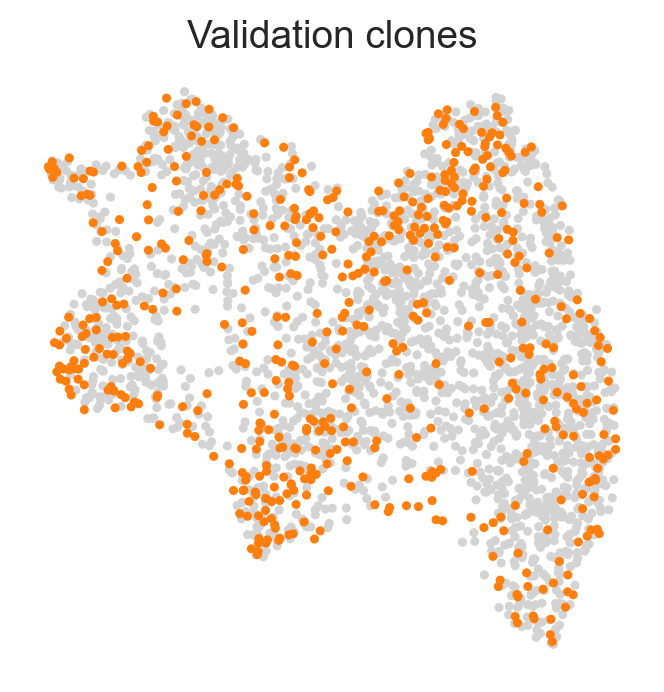

In [967]:
clones.obs["Train/validation"] = [
    "Validation" if i in validation_clone_names
    else "Train" for i in clones.obs_names
]

sc.pl.umap(
    clones,
    color="Train/validation",
    groups=["Validation"],
    legend_loc=None,
    title="Validation clones",
    frameon=False,
    save="_clone2vec_train_validation.pdf",
)

In [959]:
X_train = pd.concat([
    pdata_train.to_df(),
    pdata_train.obs["Cell type annotation short"],
], axis=1)
y_train = pd.DataFrame(
    clones[pdata_train.obs.Clone].obsm["clone2vec"],
    index=pdata_train.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
)

X_validation = pd.concat([
    pdata_validation.to_df(),
    pdata_validation.obs["Cell type annotation short"],
], axis=1)
y_validation = pd.DataFrame(
    clones[pdata_validation.obs.Clone].obsm["clone2vec"],
    index=pdata_validation.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
)

**Step 3**: CatBoost training.

In [960]:
from catboost import Pool

train = Pool(
    data=X_train,
    label=y_train,
    cat_features=["Cell type annotation short"],
)

validation = Pool(
    data=X_validation,
    label=y_validation,
    cat_features=["Cell type annotation short"],
)

In [ ]:
from catboost import CatBoostRegressor

model = CatBoostRegressor(
    loss_function="MultiRMSE",
    eval_metric="MultiRMSE",
    num_trees=10000,
    early_stopping_rounds=100,
)
model.fit(train, eval_set=validation, use_best_model=True)

**Step 4**: vizual validation of the prediction.

In this case, we will predict clone2vec coordinates for each pseudobulked cell type within each clone, and after that just take average of coordinates per each clone.

In [965]:
pdata.obsm["clone2vec_predicted"] = model.predict(Pool(
    data=pd.concat([pdata.to_df(), pdata.obs["Cell type annotation short"]], axis=1),
    label=clones[pdata.obs.Clone].obsm["clone2vec"],
    cat_features=["Cell type annotation short"],
))

clones.obsm["clone2vec_predicted"] = (
    pd.DataFrame(pdata.obsm["clone2vec_predicted"]).
    groupby(pdata.obs.Clone.values).
    mean().loc[clones.obs_names].values
)

In [966]:
X_umap = clones.obsm["X_umap"].copy()

sc.pp.neighbors(clones, use_rep="clone2vec_predicted")
sc.tl.umap(clones)

clones.obsm["X_umap_predicted"] = clones.obsm["X_umap"].copy()
clones.obsm["X_umap"] = X_umap.copy()

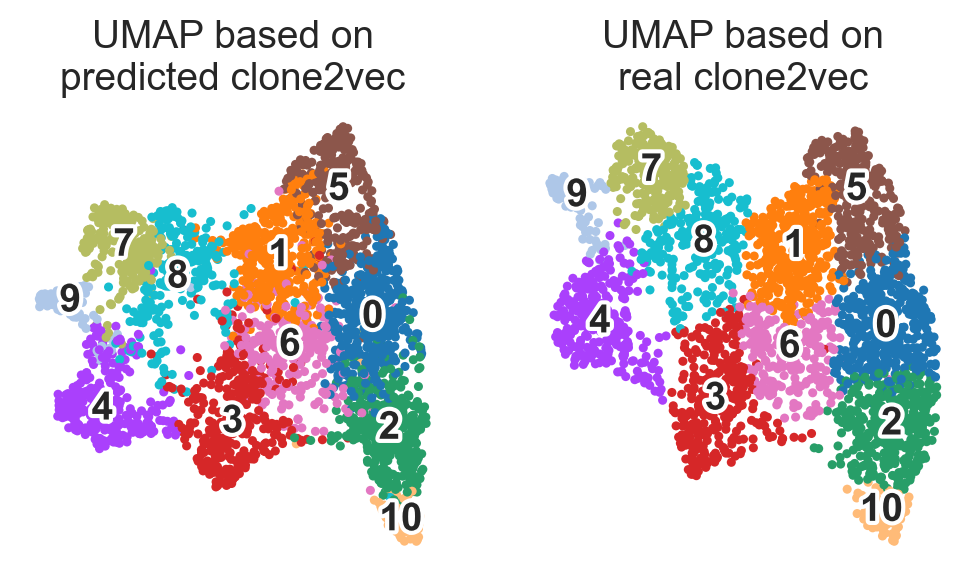

In [969]:
fig, axes = plt.subplots(ncols=2, figsize=(6, 3))

sc.pl.embedding(
    clones,
    basis="X_umap_predicted",
    color="leiden",
    legend_loc="on data",
    legend_fontoutline=3,
    title="UMAP based on\npredicted clone2vec",
    frameon=False,
    ax=axes[0],
    show=False,
)

sc.pl.umap(
    clones,
    color="leiden",
    title="UMAP based on\nreal clone2vec",
    frameon=False,
    ax=axes[1],
    show=False,
    legend_loc="on data",
    legend_fontoutline=3,
)

plt.savefig("figures/umap_clone2vec_simulated_embedding.pdf", bbox_inches="tight")

**Step 5**: calculation of feature importance.

Now, one of the important differences with the pseudotime pipeline is that here we will focus mostly on the magnitude of changes, and not on the directions. 

In [970]:
shap_values_raw = model.get_feature_importance(
    data=Pool(
        data=pd.concat([pdata.to_df(), pdata.obs["Cell type annotation short"]], axis=1),
        label=clones[pdata.obs.Clone].obsm["clone2vec"],
        cat_features=["Cell type annotation short"],
    ),
    type="ShapValues",
)

shap_values = pd.DataFrame(
    np.linalg.norm(shap_values_raw, axis=1)[:, :-1],
    columns=list(pdata.var_names) + ["Cell type"],
    index=pdata.obs_names,
)

In [971]:
shapdata = sc.AnnData(
    shap_values,
    obs=pdata.obs,
)

shapdata.var["mean_SHAP"] = shapdata.X.mean(axis=0)
for ct in set(pdata.obs["Cell type annotation short"]):
    shapdata.var[f"mean_SHAP_{ct}"] = shapdata[shapdata.obs["Cell type annotation short"] == ct].X.mean(axis=0)

Let's start with exploring the importance of cell types.

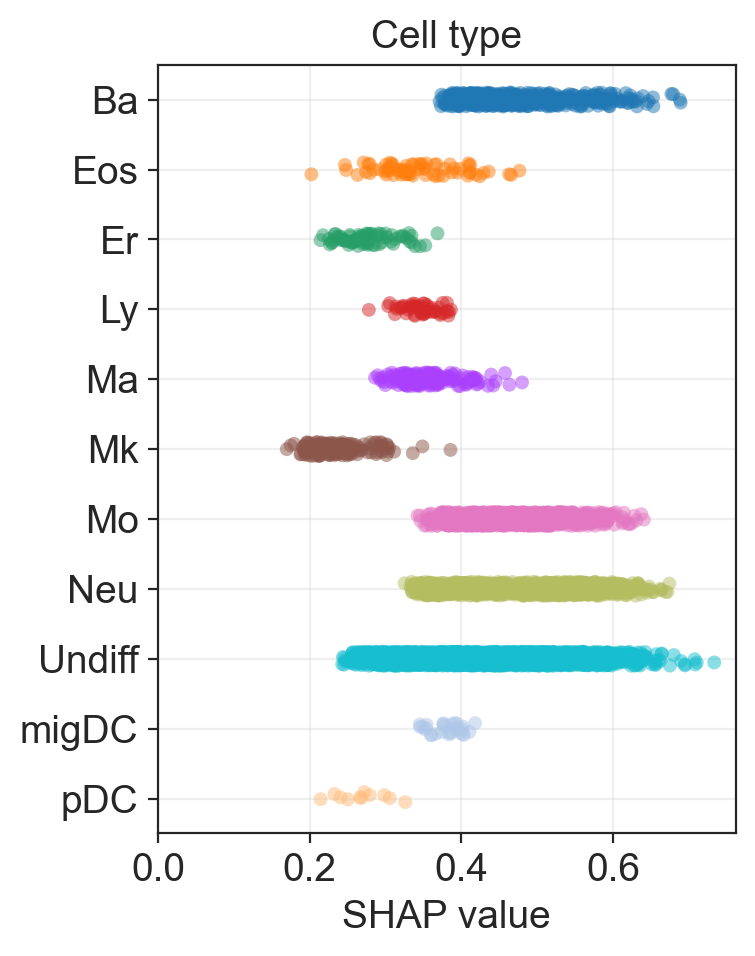

In [981]:
plot_SHAP(
    shapdata=shapdata,
    genes=["Cell type"],
    groupby="Cell type annotation short",
    colorby="Cell type annotation short",
    abs_values=True,
    fig_height=5,
)

plt.savefig("figures/clone2vec_SHAP_ct.pdf", bbox_inches="tight")

Now, we can explore the most important genes.

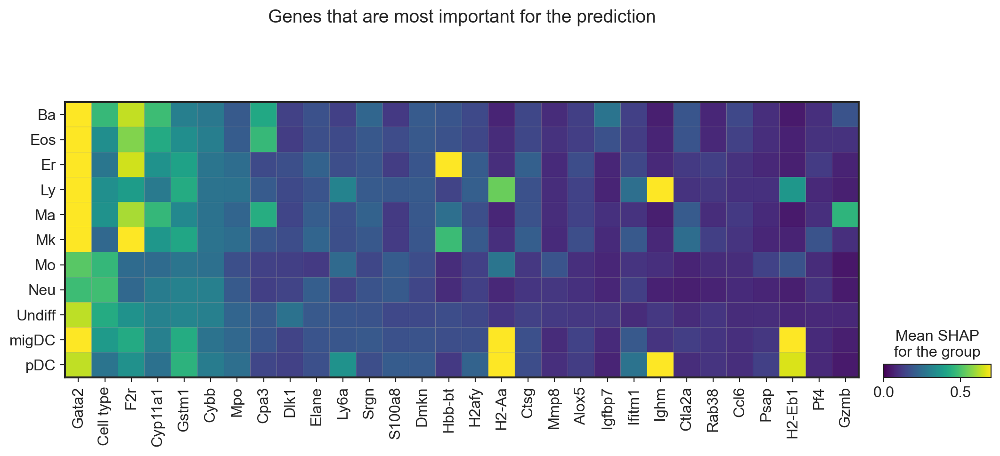

In [984]:
n_top_genes = 30
most_important_genes = shapdata.var.sort_values("mean_SHAP").iloc[::-1].head(n_top_genes).index

sc.pl.matrixplot(
    shapdata,
    var_names=most_important_genes,
    groupby="Cell type annotation short",
    colorbar_title="Mean SHAP\nfor the group",
    vmin=0,
    vmax=0.7,
    title="Genes that are most important for the prediction",
    save="clone2vec_important_genes.pdf",
)

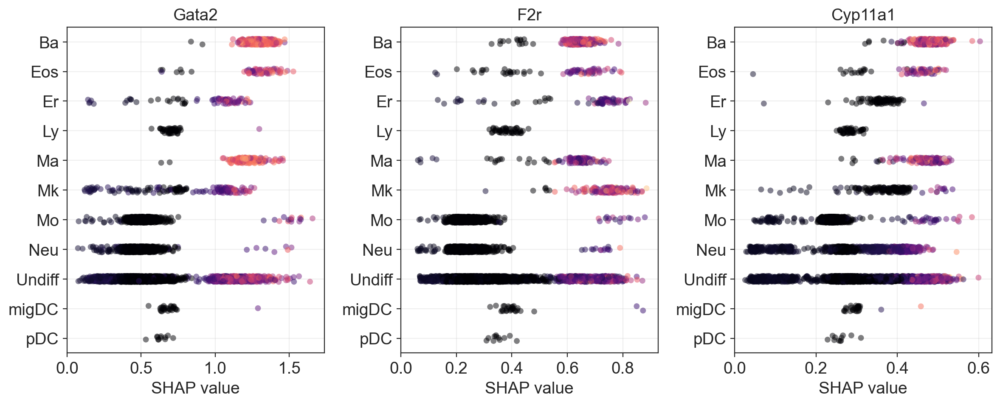

In [983]:
plot_SHAP(
    shapdata=shapdata,
    genes=["Gata2", "F2r", "Cyp11a1"],
    groupby="Cell type annotation short",
    colorby="gene_expression",
    abs_values=True,
    fig_height=5,
    palette="magma",
)

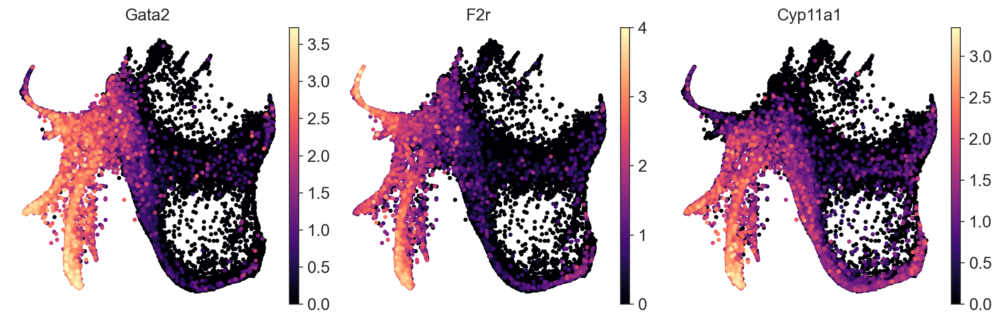

In [988]:
fig, axes = plt.subplots(figsize=(4 * 3, 4), ncols=3)

for i, gene in enumerate(["Gata2", "F2r", "Cyp11a1"]):
    if len(genes) == 1:
        ax = axes
    else:
        ax = axes[i]
    sc.pl.embedding(
        adata,
        basis="X_spring",
        color=gene,
        ax=ax,
        show=False,
        frameon=False,
        s=50,
        cmap="magma",
    )
    
fig.tight_layout()
plt.savefig("figures/umap_SHAP_most_important.pdf", bbox_inches="tight")

After that, we can go deeper and explore the most important genes for undifferentiated cells.

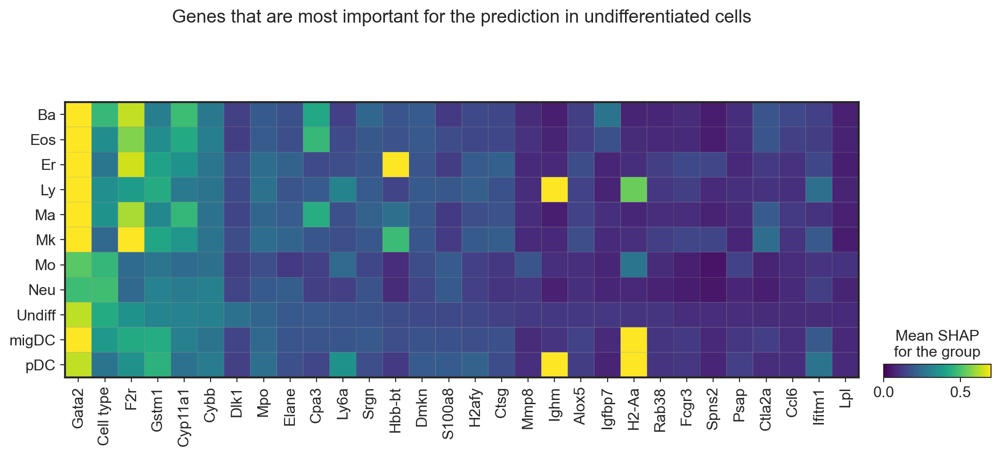

In [1005]:
ct = "Undiff"

n_top_genes = 30
most_important_genes_ct = shapdata.var.sort_values(
    f"mean_SHAP_{ct}"
).iloc[::-1].head(n_top_genes).index

sc.pl.matrixplot(
    shapdata,
    var_names=most_important_genes_ct,
    groupby="Cell type annotation short",
    colorbar_title="Mean SHAP\nfor the group",
    vmin=0,
    vmax=0.7,
    title="Genes that are most important for the prediction in undifferentiated cells",
    save="clone2vec_Undiff_most_important.pdf",
)

Here we see that the list of genes isn't just a copy of previous one because it includes many other cell fates. But, for example, genes like *Rab38*, *H2-Aa*, *Ly6a* exists in both lists.

### Cell fate bias correlates in undifferentiated cells

Here we will use Shapley Values to estimate an influence of gene expression onto a position of the clone on the clonal embedding.

In [990]:
ct = "Undiff"

selected_pdata_idx = pdata.obs["Cell type annotation short"] == ct
selected_clones = pdata[pdata.obs["Cell type annotation short"] == ct].obs.Clone.astype(str)

# Creating an AnnData object with X=obsm["clone2vec"]
c2vdata = sc.AnnData(
    X=clones[selected_clones].obsm["clone2vec"].copy(),
    obs=pdata[selected_pdata_idx].obs,
    var=pd.DataFrame(index=[f"clone2vec_{i}" for i in range(1, 11)]),
    obsm={"X_umap": clones[selected_clones].obsm["X_umap"].copy()},
)

sc.pp.neighbors(c2vdata, use_rep="X")
c2vdata.layers["spliced"] = c2vdata.X
c2vdata.layers["unspliced"] = c2vdata.X

for target_ct in clones.var_names:
    c2vdata.obs[target_ct] = clones[c2vdata.obs.Clone.astype(str), target_ct].layers["frequencies"].T[0].copy()

In [71]:
def plot_velocity(c2vdata, genes, color=None, **kwargs):
    from sklearn.preprocessing import StandardScaler
    fig, axes = plt.subplots(ncols=len(genes), figsize=(4 * len(genes), 4))
    for i, gene in enumerate(genes):
        if len(genes) == 1:
            ax = axes
        else:
            ax = axes[i]
        gene_idx = np.argwhere(shapdata.var_names == gene)[0][0]
        c2vdata.obs[gene] = pdata[selected_pdata_idx, gene].X.T[0].copy()
        c2vdata.layers[gene] = shap_values_raw[selected_pdata_idx, :, gene_idx]
        
        #expression_scaled = StandardScaler().fit_transform(c2vdata.obs[gene].values.reshape(-1, 1))
        expression_scaled = StandardScaler().fit_transform(pdata[:, gene].X.T[0].reshape(-1, 1))[selected_pdata_idx]
        c2vdata.layers[gene] = c2vdata.layers[gene] * expression_scaled

        scv.tl.velocity_graph(
            c2vdata,
            basis="X",
            vkey=gene,
            show_progress_bar=False,
        )
        
        if color is None:
            color = gene
            title = f"{gene} ({ct})",
        else:
            title = f"Grid: {gene} in {ct}\nColor: {color}",

        scv.pl.velocity_embedding_grid(
            c2vdata,
            vkey=gene,
            basis="umap",
            color=color,
            density=0.3,
            arrow_size=2,
            arrow_length=2,
            title=title,
            ax=ax,
            show=False,
            **kwargs
        )

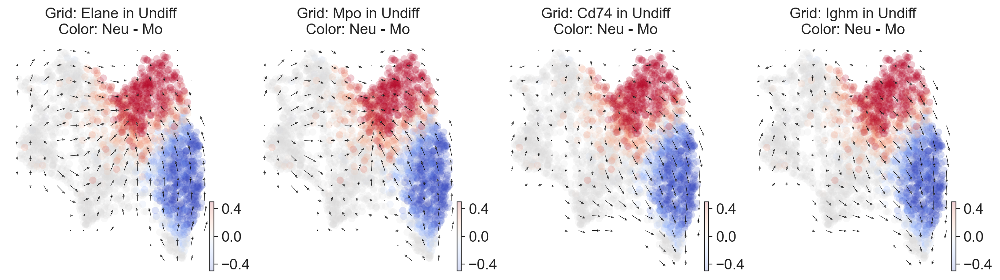

In [993]:
c2vdata.obs["Neu - Mo"] = c2vdata.obs["Neu"] - c2vdata.obs["Mo"]

plot_velocity(c2vdata, ["Elane", "Mpo", "Cd74", "Ighm"],
              color="Neu - Mo", cmap="coolwarm", vmin=-0.5, vmax=0.5)

plt.savefig("figures/velocity_clone2vec_Mo_Neu.pdf", bbox_inches="tight")

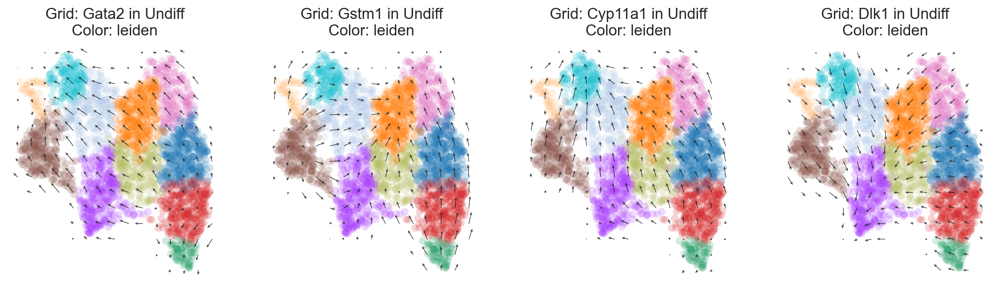

In [1010]:
clone_to_leiden = dict(clones.obs.leiden)
c2vdata.obs["leiden"] = [clone_to_leiden[i] for i in c2vdata.obs.Clone]

plot_velocity(c2vdata, ["Gata2", "Gstm1", "Cyp11a1", "Dlk1"],
              color="leiden", cmap="coolwarm", vmin=-0.5, vmax=0.5)

plt.savefig("figures/velocity_clone2vec_Undiff_top_important.pdf", bbox_inches="tight")

## Cell type-specific model

If we want to study genes that can predict position on the embedding within some cell type of interest, we can limit model training by this cell type (and repeat the procedure above).

In [49]:
# Pseudobulk preparation
adata = sl.datasets.Weinreb_in_vitro()

# Filtering of genes
sc.pp.filter_genes(adata, min_cells=25)

# Filtering of cells from other cell types
adata = adata[adata.obs["Cell type annotation short"] == "Undiff"].copy()

# Getting pseudobulk
pdata = dc.get_pseudobulk(
    adata,
    sample_col="Clone",
    groups_col="Cell type annotation short",
    mode="mean",
    min_cells=0,
    min_counts=0,
)
pdata = pdata[pdata.obs.Clone.isin(clones.obs_names)].copy()

In [56]:
# Train / validation datasets
clone_names = clones.obs_names
sketch_index = gs(clones.obsm["clone2vec"], len(clones) // 5, replace=False)
validation_clone_names = clone_names[sketch_index]

pdata_train = pdata[~pdata.obs.Clone.isin(validation_clone_names)].copy()
pdata_validation = pdata[pdata.obs.Clone.isin(validation_clone_names)].copy()

X_train = pdata_train.to_df()
y_train = pd.DataFrame(
    clones[pdata_train.obs.Clone].obsm["clone2vec"],
    index=pdata_train.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
)

X_validation = pdata_validation.to_df()
y_validation = pd.DataFrame(
    clones[pdata_validation.obs.Clone].obsm["clone2vec"],
    index=pdata_validation.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
)

train = Pool(data=X_train, label=y_train)
validation = Pool(data=X_validation, label=y_validation)

In [1018]:
# Model training
model = CatBoostRegressor(
    loss_function="MultiRMSE",
    eval_metric="MultiRMSE",
    num_trees=10000,
    early_stopping_rounds=100,
)
model.fit(train, eval_set=validation, use_best_model=True)

In [61]:
# Model predictions check
pdata.obsm["clone2vec_predicted"] = model.predict(Pool(
    data=pdata.to_df(),
    label=clones[pdata.obs.Clone].obsm["clone2vec"],
))

clones = clones[clones.obs_names.isin(pdata.obs.Clone)].copy()
clones.obsm["clone2vec_predicted"] = (
    pd.DataFrame(pdata.obsm["clone2vec_predicted"]).
    groupby(pdata.obs.Clone.values).
    mean().loc[clones.obs_names].values
)

In [62]:
X_umap = clones.obsm["X_umap"].copy()

sc.pp.neighbors(clones, use_rep="clone2vec_predicted")
sc.tl.umap(clones)

clones.obsm["X_umap_predicted"] = clones.obsm["X_umap"].copy()
clones.obsm["X_umap"] = X_umap.copy()

<Axes: title={'center': 'UMAP based on\nreal clone2vec'}, xlabel='UMAP1', ylabel='UMAP2'>

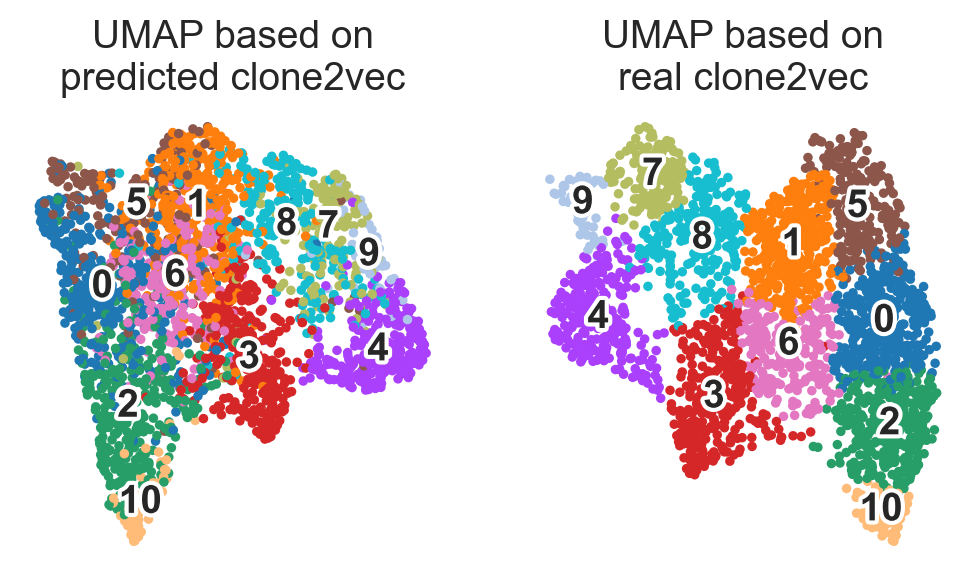

In [63]:
fig, axes = plt.subplots(ncols=2, figsize=(6, 3))

sc.pl.embedding(
    clones,
    basis="X_umap_predicted",
    color="leiden",
    legend_loc="on data",
    legend_fontoutline=3,
    title="UMAP based on\npredicted clone2vec",
    frameon=False,
    ax=axes[0],
    show=False,
)

sc.pl.umap(
    clones,
    color="leiden",
    title="UMAP based on\nreal clone2vec",
    frameon=False,
    ax=axes[1],
    show=False,
    legend_loc="on data",
    legend_fontoutline=3,
)

plt.savefig("figures/umap_clone2vec_simulated_embedding_Undiff.pdf", bbox_inches="tight")

In [64]:
shap_values_raw = model.get_feature_importance(
    data=Pool(data=pdata.to_df(), label=clones[pdata.obs.Clone].obsm["clone2vec"]),
    type="ShapValues",
)

shap_values = pd.DataFrame(
    np.linalg.norm(shap_values_raw, axis=1)[:, :-1],
    columns=list(pdata.var_names),
    index=pdata.obs_names,
)

shapdata = sc.AnnData(shap_values, obs=pdata.obs)
shapdata.var["mean_SHAP"] = shapdata.X.mean(axis=0)

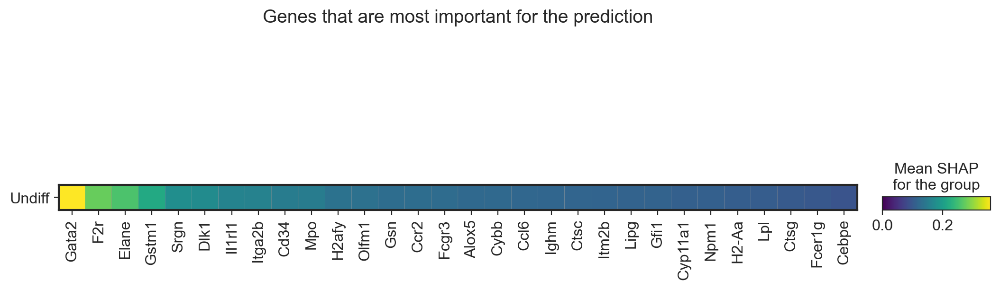

In [66]:
n_top_genes = 30
most_important_genes = shapdata.var.sort_values("mean_SHAP").iloc[::-1].head(n_top_genes).index

sc.pl.matrixplot(
    shapdata,
    var_names=most_important_genes,
    groupby="Cell type annotation short",
    colorbar_title="Mean SHAP\nfor the group",
    vmin=0,
    title="Genes that are most important for the prediction",
    save="clone2vec_important_genes_Undiff_model.pdf",
)

In [67]:
ct = "Undiff"

selected_pdata_idx = pdata.obs["Cell type annotation short"] == ct
selected_clones = pdata[pdata.obs["Cell type annotation short"] == ct].obs.Clone.astype(str)

# Creating an AnnData object with X=obsm["clone2vec"]
c2vdata = sc.AnnData(
    X=clones[selected_clones].obsm["clone2vec"].copy(),
    obs=pdata[selected_pdata_idx].obs,
    var=pd.DataFrame(index=[f"clone2vec_{i}" for i in range(1, 11)]),
    obsm={"X_umap": clones[selected_clones].obsm["X_umap"].copy()},
)

sc.pp.neighbors(c2vdata, use_rep="X")
c2vdata.layers["spliced"] = c2vdata.X
c2vdata.layers["unspliced"] = c2vdata.X

for target_ct in clones.var_names:
    c2vdata.obs[target_ct] = clones[c2vdata.obs.Clone.astype(str), target_ct].layers["frequencies"].T[0].copy()

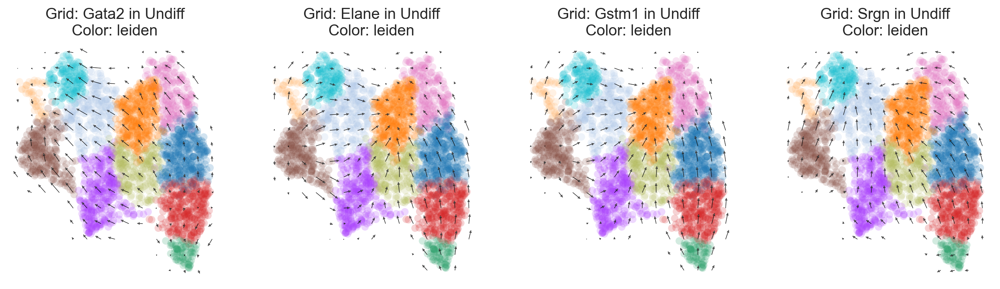

In [73]:
clone_to_leiden = dict(clones.obs.leiden)
c2vdata.obs["leiden"] = [clone_to_leiden[i] for i in c2vdata.obs.Clone]

plot_velocity(c2vdata, ["Gata2", "Elane", "Gstm1", "Srgn"],
              color="leiden", cmap="coolwarm", vmin=-0.5, vmax=0.5)

plt.savefig("figures/velocity_clone2vec_Undiff_top_important_Undiff.pdf", bbox_inches="tight")

After that, we can compare importance calculated by the model included all cell types with the undifferentiated cells-specific model.

In [76]:
shapdata_Undiff = shapdata.copy()

In [74]:
model_all = CatBoostRegressor().load_model("catboost_models/clone2vec.cbm")
shap_values_raw = model_all.get_feature_importance(
    data=Pool(
        data=pd.concat([pdata.to_df(), pdata.obs["Cell type annotation short"]], axis=1),
        label=clones[pdata.obs.Clone].obsm["clone2vec"],
        cat_features=["Cell type annotation short"],
    ),
    type="ShapValues",
)

shap_values = pd.DataFrame(
    np.linalg.norm(shap_values_raw, axis=1)[:, :-1],
    columns=list(pdata.var_names) + ["Cell type"],
    index=pdata.obs_names,
)

shapdata_all = sc.AnnData(shap_values, obs=pdata.obs)
shapdata_all.var["mean_SHAP"] = shapdata_all.X.mean(axis=0)

Text(0, 0.5, 'Shap value in overall model')

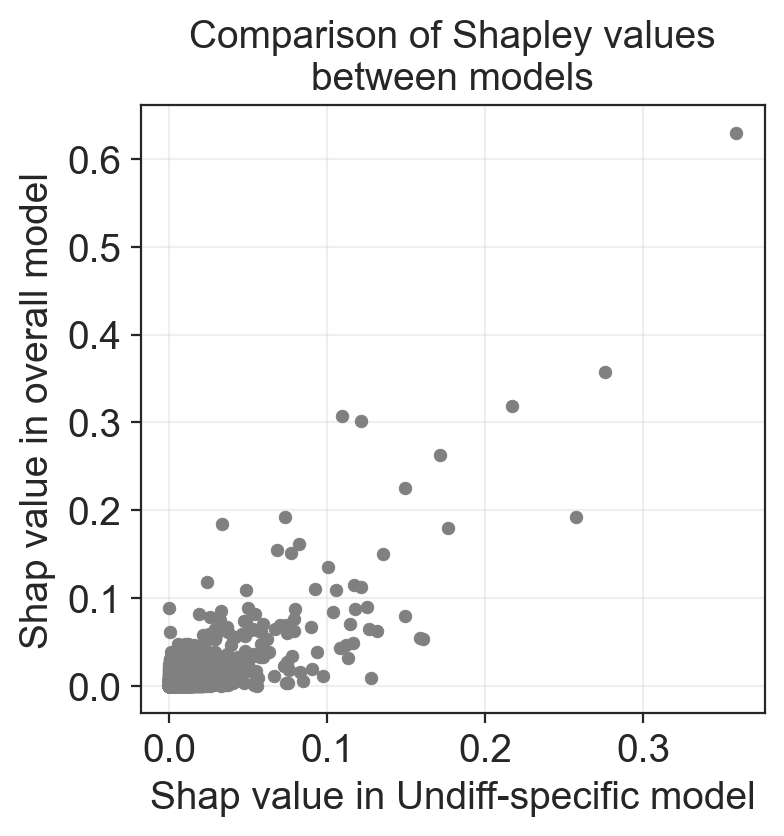

In [77]:
common_genes = shapdata_all.var_names[shapdata_all.var_names.isin(shapdata_Undiff.var_names)]
fig, ax = plt.subplots(figsize=(4, 4))

sns.scatterplot(
    x=shapdata_Undiff.var.loc[common_genes]["mean_SHAP"],
    y=shapdata_all.var.loc[common_genes]["mean_SHAP"],
    ax=ax,
    edgecolor=None,
    s=20,
    color="grey",
)

ax.set_title("Comparison of Shapley values\nbetween models")
ax.grid(alpha=0.3)

# ax.set_yscale("log")
# ax.set_xscale("log")

ax.set_xlabel("Shap value in Undiff-specific model")
ax.set_ylabel("Shap value in overall model")

In [79]:
most_important_genes

Index(['Gata2', 'F2r', 'Elane', 'Gstm1', 'Srgn', 'Dlk1', 'Il1rl1', 'Itga2b',
       'Cd34', 'Mpo', 'H2afy', 'Olfm1', 'Gsn', 'Ccr2', 'Fcgr3', 'Alox5',
       'Cybb', 'Ccl6', 'Ighm', 'Ctsc', 'Itm2b', 'Lipg', 'Gfi1', 'Cyp11a1',
       'Npm1', 'H2-Aa', 'Lpl', 'Ctsg', 'Fcer1g', 'Cebpe'],
      dtype='object')

In [84]:
clones_expr = sl.tl.summarize_expression(
    adata=adata,
    clones=clones,
    obs_name="Clone",
    subset_obs="Cell type annotation short",
    target_value="Undiff",
)

In [93]:
clones[np.argsort(clones_expr[:, "Gata2"].X.A.T[0])]

View of AnnData object with n_obs × n_vars = 2556 × 11
    obs: 'n_cells', 'leiden'
    uns: 'clone2vec_mean_loss', 'leiden', 'leiden_colors', 'neighbors', 'umap'
    obsm: 'X_umap', 'clone2vec', 'clone2vec_predicted', 'X_umap_predicted'
    layers: 'counts', 'frequencies'
    obsp: 'connectivities', 'distances'